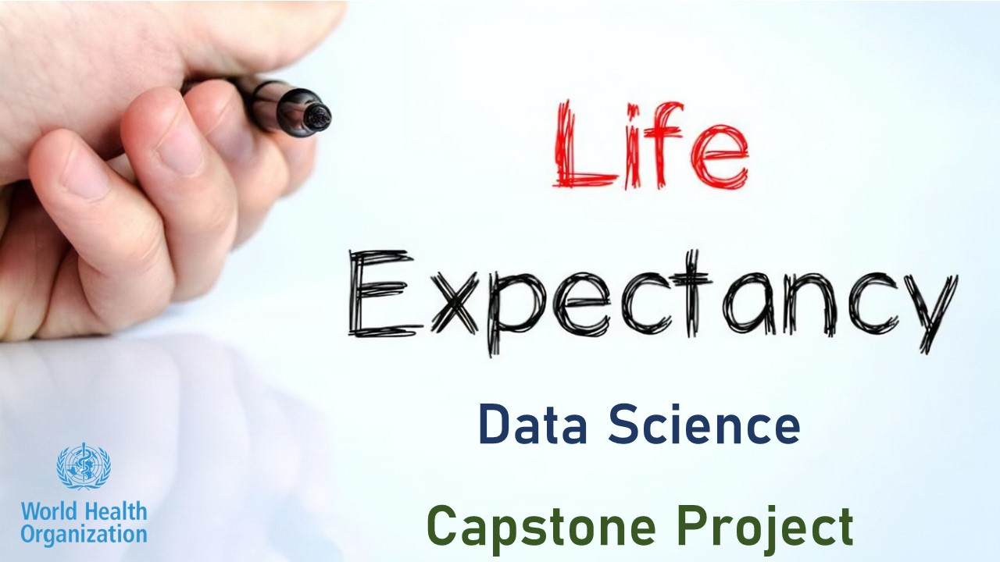

# Importing required libraries

In [1]:
#Regression related libraries
from scipy import stats
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder,LabelEncoder,StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [2]:
# WHO Dataset on Life expectncy 
# Source of csv file: "KAGGLE"
df=pd.read_csv(r"C:\Users\ANURAG\PGA23\ML Project\Life Expectancy Data.csv")

In [3]:
df.head(20)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,66.0,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,...,63.0,9.42,63.0,0.1,445.893298,284331.0,18.6,18.7,0.434,8.9
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,...,64.0,8.33,64.0,0.1,373.361116,2729431.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,...,63.0,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,...,58.0,7.43,58.0,0.1,272.563770,2589345.0,19.2,19.3,0.405,8.1


In [4]:
# Total countries in dataset
df["Country"].nunique()

193

In [5]:
# Different counrties in data
df["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [6]:
# Unique valuecount in dataset
df.apply(lambda x: len(x.unique()))         

Country                             193
Year                                 16
Status                                2
Life expectancy                     363
Adult Mortality                     426
infant deaths                       209
Alcohol                            1077
percentage expenditure             2328
Hepatitis B                          88
Measles                             958
 BMI                                609
under-five deaths                   252
Polio                                74
Total expenditure                   819
Diphtheria                           82
 HIV/AIDS                           200
GDP                                2491
Population                         2279
 thinness  1-19 years               201
 thinness 5-9 years                 208
Income composition of resources     626
Schooling                           174
dtype: int64

In [7]:
# Checking Column and their reprective name in dataframe
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

`Note`:<br>
As per the information given about the dataset , i got to know about the column " thinness  1-19 years" 
is information of thinness of kids between 10 to 19 not kids of age group between 1 to 19. So, I will rename it

In [8]:
df.rename(columns = {' thinness  1-19 years':'thinness 10-19 years'}, inplace = True)  


In [9]:
#Checking Datatype of columns
df.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
thinness 10-19 years               float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

In [10]:
df.shape

(2938, 22)

In [11]:
df.columns = df.columns.str.strip()
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

### Getting Information about the dataset

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [13]:
#Checking duplicates
df.duplicated().sum()

0

## Observations:
    1)There are total 2938 rows and 22 Columns
    2)There are only two categorical columns : "Country" and "Status"
    3)There is space in column-names either before or after column name. 
      Columns like: BMI ,under-five deaths,Measles,etc.
      I treated it.
    4)The column named thinness  1-19 years needs to be corrected as the data represents 
      Thinness of kids (in %) among kids of age group 10 to 19 years of age.
    5)There are total 193 countries in dataset
    6)No dupliate value
            
        

### Checking null values in dataset 

In [14]:
df.isnull().values.any()

True

In [15]:
df.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness 10-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [16]:
nv=df.isna().sum()
nv[nv>0]

Life expectancy                     10
Adult Mortality                     10
Alcohol                            194
Hepatitis B                        553
BMI                                 34
Polio                               19
Total expenditure                  226
Diphtheria                          19
GDP                                448
Population                         652
thinness 10-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [17]:
#Total values of all columns 
for i in df:
    print("Total Value counts",i,"is",df[i].value_counts().sum())
    print("\n")

Total Value counts Country is 2938


Total Value counts Year is 2938


Total Value counts Status is 2938


Total Value counts Life expectancy is 2928


Total Value counts Adult Mortality is 2928


Total Value counts infant deaths is 2938


Total Value counts Alcohol is 2744


Total Value counts percentage expenditure is 2938


Total Value counts Hepatitis B is 2385


Total Value counts Measles is 2938


Total Value counts BMI is 2904


Total Value counts under-five deaths is 2938


Total Value counts Polio is 2919


Total Value counts Total expenditure is 2712


Total Value counts Diphtheria is 2919


Total Value counts HIV/AIDS is 2938


Total Value counts GDP is 2490


Total Value counts Population is 2286


Total Value counts thinness 10-19 years is 2904


Total Value counts thinness 5-9 years is 2904


Total Value counts Income composition of resources is 2771


Total Value counts Schooling is 2775




In [18]:
# Function for finding missing values and its percentage 
def myMissing(data): 
    gj=pd.DataFrame(data.isnull().sum()).reset_index()
    gj.columns=["Column_name", "Missing_Count"]
    gh=pd.DataFrame(round((data.isnull().sum()/data.shape[0])*100,2)).reset_index()
    gh.columns=["Column_name", "MissingValue_InPercentage"]
    dfg=pd.merge(gj, gh, on=["Column_name"], how="inner")
    final=dfg.sort_values(by=["Missing_Count"],ascending=False)
    return final

In [19]:
myMissing(df)

,Column_name,Missing_Count,MissingValue_InPercentage
17,Population,652,22.19
8,Hepatitis B,553,18.82
16,GDP,448,15.25
13,Total expenditure,226,7.69
6,Alcohol,194,6.60
20,Income composition of resources,167,5.68
21,Schooling,163,5.55
19,thinness 5-9 years,34,1.16
18,thinness 10-19 years,34,1.16
10,BMI,34,1.16


### Making copy of Dataframe 

In [20]:
df_copy=df.copy()
df_copy.shape

(2938, 22)

In [21]:
df_copy.fillna(df_copy.median(), inplace=True)

C:\Users\ANURAG\AppData\Local\Temp\ipykernel_20028\4015894223.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_copy.fillna(df_copy.median(), inplace=True)


In [22]:
df_copy.isna().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness 10-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

## Inference:
      There are columns having null values
      so, we can either drop them or replace them with values like mean,median or mode or custom value
      I am replacing the values with median as most columns have null values and data may be lost cant afford to lose it.
        

In [23]:
df_copy.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

#### Numerical cols

In [24]:
num_cols=df_copy.select_dtypes(exclude="object").columns
num_cols

Index(['Year', 'Life expectancy', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness 10-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

#### Categoricl columns

In [25]:
cat_cols=df_copy.select_dtypes(include="object").columns
cat_cols

Index(['Country', 'Status'], dtype='object')

In [26]:
df_copy.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [27]:
df_copy.shape

(2938, 22)

In [28]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2938 non-null   float64
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [29]:
# Averaging all data by country
df_aver_country = df_copy.groupby('Country').mean().reset_index()
df_aver_country["Life expectancy"] = round(df_aver_country["Life expectancy"],2)

In [30]:
#Lowest life expectancy wise top 10 countries 
low_life = df_aver_country.sort_values(by=['Life expectancy'])[['Country','Life expectancy']]
low_life.head(10)

,Country,Life expectancy
152,Sierra Leone,46.11
31,Central African Republic,48.51
94,Lesotho,48.78
3,Angola,49.02
100,Malawi,49.89
32,Chad,50.39
44,Côte d'Ivoire,50.39
192,Zimbabwe,50.49
164,Swaziland,51.32
123,Nigeria,51.36


In [31]:
#Best life expectancy with comparision to top 10 countries
best_life = df_aver_country.sort_values(by=['Life expectancy'], ascending = False)[['Country','Life expectancy']]
best_life.head(10)

,Country,Life expectancy
84,Japan,82.54
165,Sweden,82.52
75,Iceland,82.44
166,Switzerland,82.33
60,France,82.22
82,Italy,82.19
160,Spain,82.07
7,Australia,81.81
125,Norway,81.79
30,Canada,81.69


In [32]:
# Overview about the infant deaths trend year by year in INDIA
india = df_copy[df['Country'].str.strip()=='India'].sort_values('Year')
india[['Year', 'infant deaths']].head(5)

,Year,infant deaths
1201,2000,1800
1200,2001,1800
1199,2002,1700
1198,2003,1700
1197,2004,1600


In [33]:
india[['Year', 'infant deaths']].describe()


,Year,infant deaths
count,16.000000,16.000000
mean,2007.500000,1366.687500
std,4.760952,303.160402
min,2000.000000,910.000000
25%,2003.750000,1100.000000
50%,2007.500000,1350.000000
75%,2011.250000,1625.000000
max,2015.000000,1800.000000


#### Plot data for "Infant deaths" column


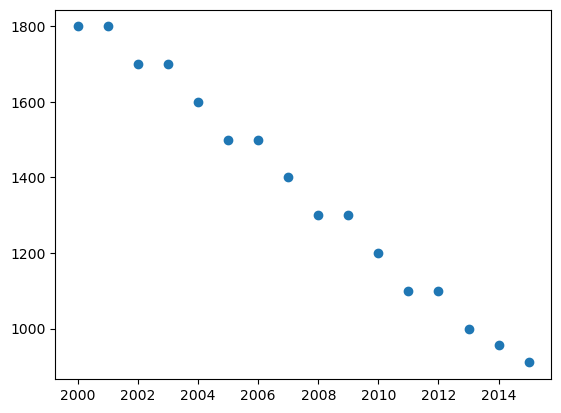

In [34]:
x_year = india['Year'].values
y_infant_deaths = india['infant deaths'].values
plt.scatter(x_year, y_infant_deaths)
plt.show()

## Inferance:
We can clearly see that death counts in India decreased year by year (infant deaths were `1800` in the year 2000 which further decreased to `900` in 2014).

## Statistical overview about the data 

In [35]:
df_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2938.0,6.923472e+01,9.509115e+00,36.30000,63.200000,7.210000e+01,7.560000e+01,8.900000e+01
Adult Mortality,2938.0,1.647257e+02,1.240862e+02,1.00000,74.000000,1.440000e+02,2.270000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2938.0,4.546875e+00,3.921946e+00,0.01000,1.092500,3.755000e+00,7.390000e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2938.0,8.302212e+01,2.299698e+01,1.00000,82.000000,9.200000e+01,9.600000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2938.0,3.838118e+01,1.993537e+01,1.00000,19.400000,4.350000e+01,5.610000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


### Categorical to numerical column comparison

In [36]:
df_copy["Status"].value_counts()


Developing    2426
Developed      512
Name: Status, dtype: int64

In [37]:
df_copy["Status"].value_counts(normalize=True)

Developing    0.825732
Developed     0.174268
Name: Status, dtype: float64

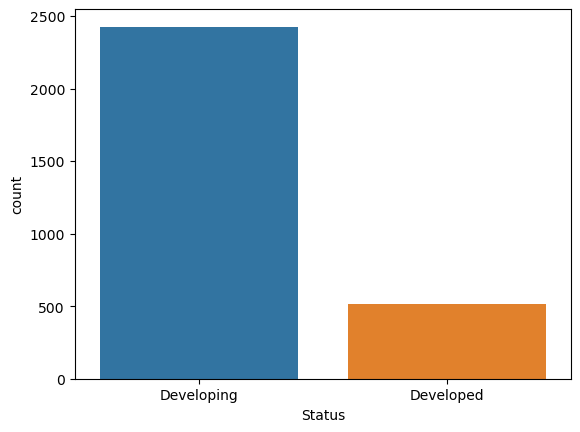

In [38]:
#Plotting Countplot using seaborn
sns.countplot(x=df_copy['Status'])
plt.show()

<AxesSubplot:xlabel='Status', ylabel='Alcohol'>

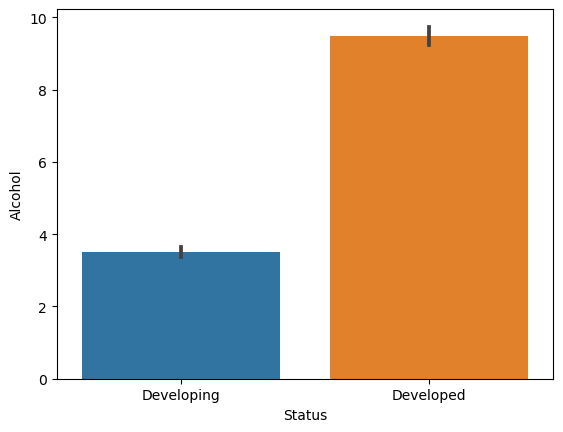

In [39]:
#Status wise alcohol consumptions
sns.barplot(data=df_copy,x=df_copy["Status"],y=df_copy["Alcohol"])

<AxesSubplot:xlabel='Status', ylabel='Adult Mortality'>

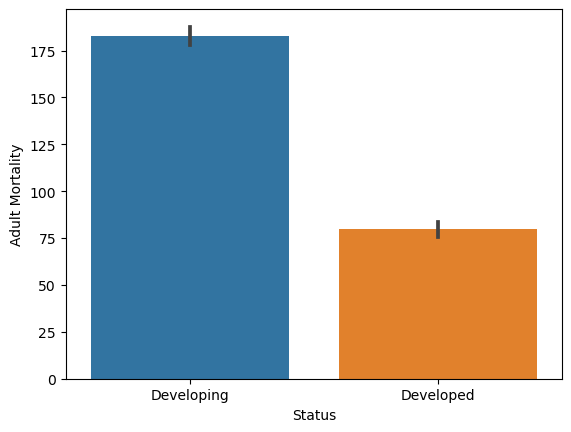

In [40]:
#Status wise adult mortality
sns.barplot(data=df_copy,x=df_copy["Status"],y=df_copy["Adult Mortality"])

<AxesSubplot:xlabel='Status', ylabel='infant deaths'>

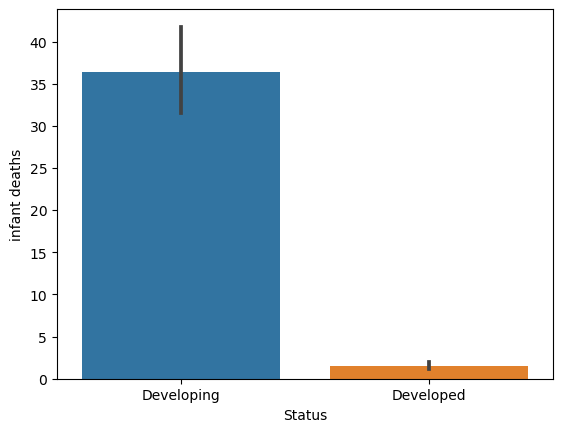

In [41]:
#Status wise infant deaths
sns.barplot(data=df_copy,x=df_copy["Status"],y=df_copy["infant deaths"])

## Outlier detection and treatment

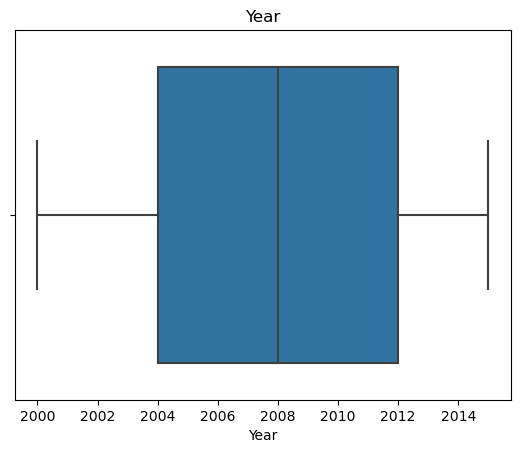

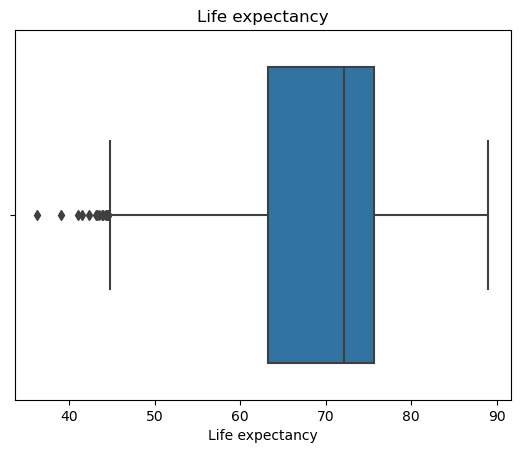

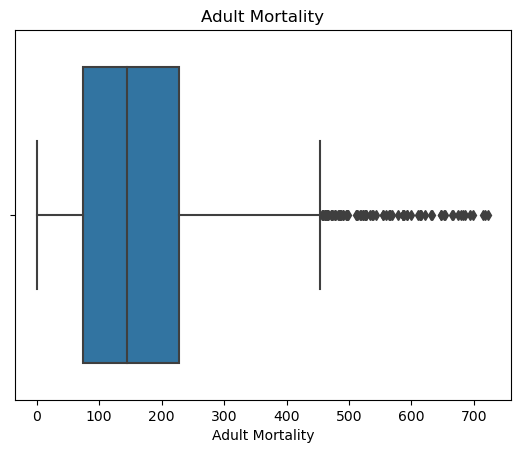

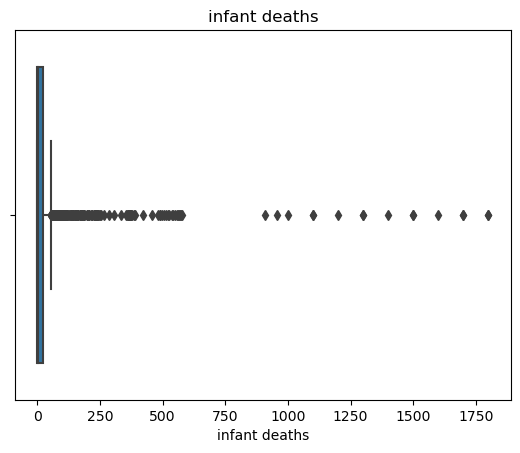

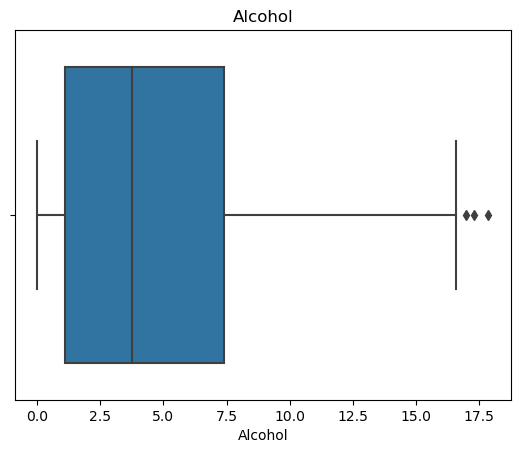

...

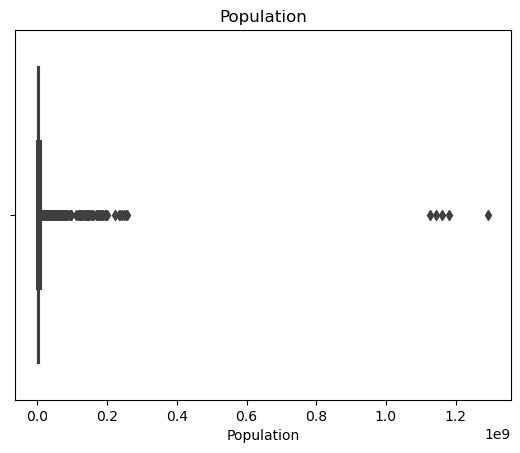

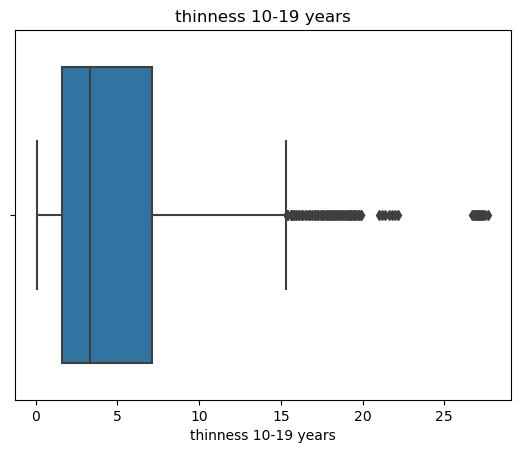

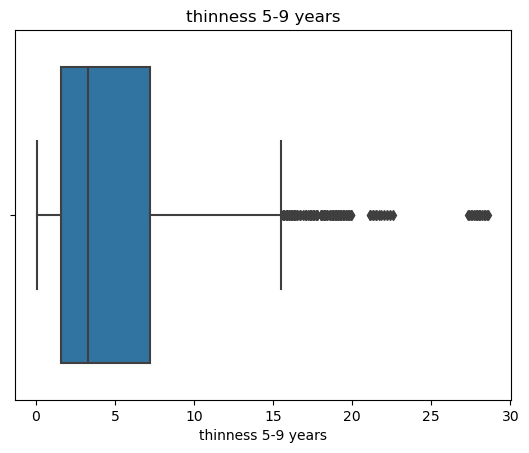

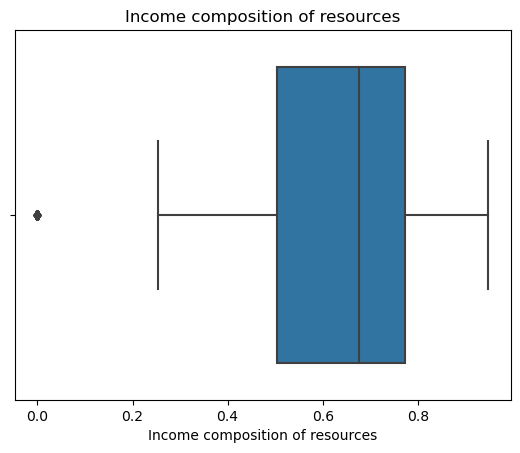

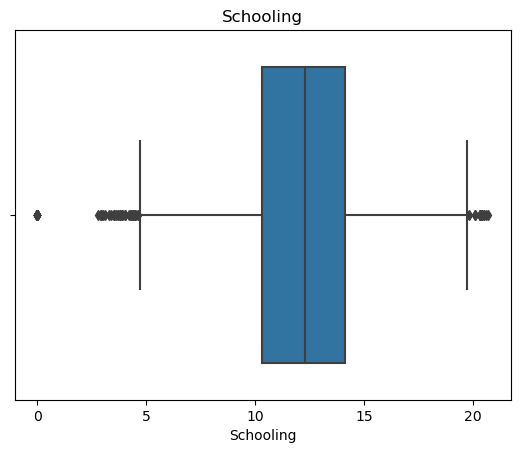

In [42]:
# For outliers and distribution
for i in num_cols:
    sns.boxplot(x=df_copy[i])
    plt.title(i)
    plt.show()

In [43]:
#Checking Outliers on lower side
df_copy.describe(percentiles=[0.01,0.02,0.03,0.04,0.05,0.06]).T

,count,mean,std,min,1%,2%,3%,4%,5%,6%,50%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2.008000e+03,2.015000e+03
Life expectancy,2938.0,6.923472e+01,9.509115e+00,36.30000,45.600000,47.322000,48.500000,49.800000,51.400000,52.000000,7.210000e+01,8.900000e+01
Adult Mortality,2938.0,1.647257e+02,1.240862e+02,1.00000,4.370000,7.000000,11.000000,12.000000,13.000000,14.000000,1.440000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000e+00,1.800000e+03
Alcohol,2938.0,4.546875e+00,3.921946e+00,0.01000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,3.755000e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.491291e+01,1.947991e+04
Hepatitis B,2938.0,8.302212e+01,2.299698e+01,1.00000,6.000000,8.000000,8.000000,9.000000,9.000000,21.220000,9.200000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.700000e+01,2.121830e+05
BMI,2938.0,3.838118e+01,1.993537e+01,1.00000,2.300000,2.700000,3.411000,4.400000,5.200000,5.700000,4.350000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000e+00,2.500000e+03


#### We can observe that these columns have outliers on lower side:
    "Life Expectancy"
    "Hepatitis B"
    "Polio"
    "Diphtheria"
    "Schooling"

In [44]:
#Checking outliers on upper side
df_copy.describe(percentiles=[0.94,0.95,0.96,0.97,0.98,0.99]).T

,count,mean,std,min,50%,94%,95%,96%,97%,98%,99%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2.008000e+03,2.015000e+03,2.015000e+03,2.015000e+03,2.015000e+03,2.015000e+03,2.015000e+03,2.015000e+03
Life expectancy,2938.0,6.923472e+01,9.509115e+00,36.30000,7.210000e+01,8.160000e+01,8.200000e+01,8.230000e+01,8.300000e+01,8.400000e+01,8.663000e+01,8.900000e+01
Adult Mortality,2938.0,1.647257e+02,1.240862e+02,1.00000,1.440000e+02,3.820000e+02,3.973000e+02,4.280000e+02,4.520000e+02,4.920400e+02,5.830400e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,3.000000e+00,8.356000e+01,9.415000e+01,1.316000e+02,1.868900e+02,2.465200e+02,4.950400e+02,1.800000e+03
Alcohol,2938.0,4.546875e+00,3.921946e+00,0.01000,3.755000e+00,1.157780e+01,1.189000e+01,1.210000e+01,1.240000e+01,1.301520e+01,1.345000e+01,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,6.491291e+01,3.687417e+03,4.506638e+03,5.485375e+03,6.569217e+03,7.989476e+03,1.019941e+04,1.947991e+04
Hepatitis B,2938.0,8.302212e+01,2.299698e+01,1.00000,9.200000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,1.700000e+01,8.066280e+03,9.985550e+03,1.274264e+04,1.834331e+04,3.061846e+04,5.416336e+04,2.121830e+05
BMI,2938.0,3.838118e+01,1.993537e+01,1.00000,4.350000e+01,6.390000e+01,6.470000e+01,6.545200e+01,6.640000e+01,6.800000e+01,7.206300e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,4.000000e+00,1.207800e+02,1.380000e+02,1.776400e+02,2.554500e+02,3.466800e+02,7.678200e+02,2.500000e+03


#### We can observe that these columns have outliers on Upper side:
    "Adult Mortality", "Total expendicture","thinness 1-19 years","thinness 5-9 years"

In [45]:
#Treating outliers by making function
def outtreat(x):
    x=x.clip(upper=x.quantile(0.98))
    x=x.clip(lower=x.quantile(0.02))
    return x

In [46]:
#Outlier treatment
outliers_cols =["Adult Mortality", "Total expenditure","thinness 10-19 years","thinness 5-9 years",
                "Life expectancy","Hepatitis B","Polio","Diphtheria","Schooling"]
df_copy[outliers_cols] = df_copy[outliers_cols].apply(outtreat)


## Inferences:
    1)Made a copy of dataframe so that orignal data will not be affected
    2)Assigned categorical and numerical columns for that we can do further EDA
    3)Used countplot to count the values in categorical column "Status"
    4)Observed that alchohol consumption is more in developed nation with comparision to developing nations.
    5)Developing nation has more cases of adult and infant death with comparision to develped nations.
    6)Statistical summary used for obeserving the numerical columns
    7)With boxplot detected outliers in columns :
        "Adult Mortality", "Total expenditure","thinness  1-19 years","thinness 5-9 years",
        "Life expectancy","Hepatitis B","Polio","Diphtheria","Schooling"
    8)Used clip method for removing outliers 

In [47]:
df_copy.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,7.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.8,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,17.8,18.2,0.454,9.5


### Categorical to Numerical comparision

In [48]:
#Checking minimum age 
df_copy.groupby(["Country"])["Life expectancy"].min()

Country
Afghanistan                           54.800
Albania                               72.600
Algeria                               71.300
Angola                                47.322
Antigua and Barbuda                   73.600
                                       ...  
Venezuela (Bolivarian Republic of)    72.400
Viet Nam                              73.400
Yemen                                 61.100
Zambia                                47.322
Zimbabwe                              47.322
Name: Life expectancy, Length: 193, dtype: float64

In [49]:
df_copy.groupby(["Country"]).agg({"Life expectancy":["min", "mean", "max"]})


Life expectancy                 
                                               min       mean   max
Country                                                            
Afghanistan                                 54.800  58.193750  65.0
Albania                                     72.600  75.156250  77.8
Algeria                                     71.300  73.618750  75.6
Angola                                      47.322  49.344375  56.0
Antigua and Barbuda                         73.600  75.056250  76.4
...                                            ...        ...   ...
Venezuela (Bolivarian Republic of)          72.400  73.387500  74.1
Viet Nam                                    73.400  74.775000  76.0
Yemen                                       61.100  63.862500  68.0
Zambia                                      47.322  54.468000  63.0
Zimbabwe                                    47.322  51.554750  67.0

[193 rows x 3 columns]

In [50]:
df_copy.groupby(["Status"])["Life expectancy"].min()

Status
Developed     69.900
Developing    47.322
Name: Life expectancy, dtype: float64

In [51]:
df_copy.groupby(["Status"]).agg({"Life expectancy":["min", "mean", "max"]})

Life expectancy                 
                       min       mean   max
Status                                     
Developed           69.900  78.951758  84.0
Developing          47.322  67.169826  84.0

## Inference:
    According to data :
        ->Minimum life span of developed nations is 69years of age
        ->Minimum life span of developing nation is 47year of age
        ->On an average people in developed nations live more than of people in  devloping nation

## Assumptions of Linear Regression:
    1. The Two Variables Should be in a Linear Relationship 
    2. All the Variables Should be Multivariate Normal 
    3. There Should be No Multicollinearity in the Data
    4. There Should be No Autocorrelation in the Data
    5. There Should be Homoscedasticity Among the Data

## Bivariate Analysis

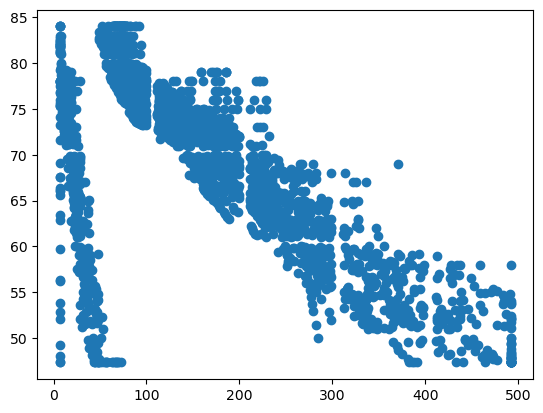

In [52]:
# These columns are negatively correlated 
plt.scatter(df_copy["Adult Mortality"],df_copy["Life expectancy"])
plt.show()

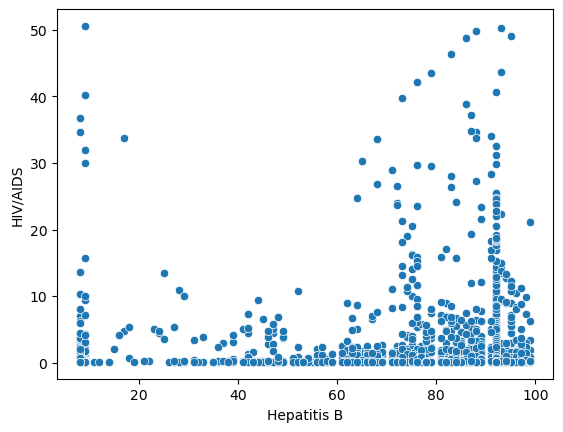

In [53]:
sns.scatterplot(x='Hepatitis B',y='HIV/AIDS',data=df_copy)
plt.show()

## Plotting Pair-plot


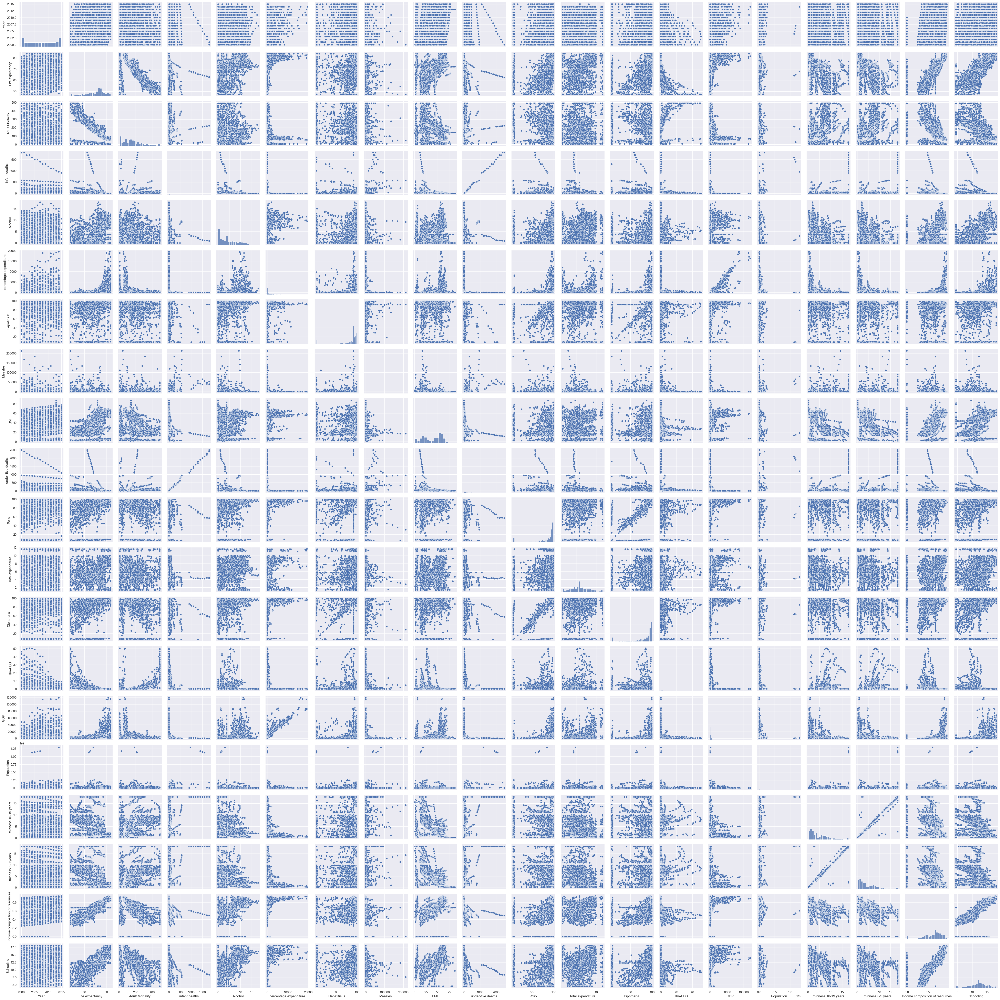

In [54]:
# We can observe there is a linear relationship in dataset 
sns.set(rc={"figure.figsize":(8, 4)})
sns.pairplot(data=df_copy,vars=df_copy[num_cols])
plt.show()

C:\Users\ANURAG\AppData\Local\Temp\ipykernel_20028\3543636311.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  histogram = sns.distplot(df_copy.iloc[:,3], hist = True)


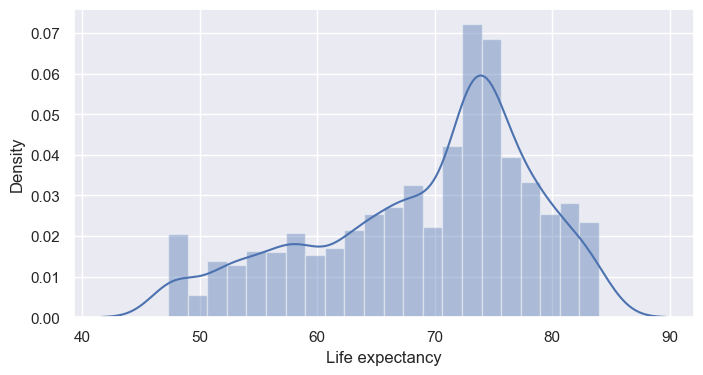

In [55]:
#Checking distribution of the data on target variable "Life Expectancy"
histogram = sns.distplot(df_copy.iloc[:,3], hist = True)
plt.show()

## Inference:
    We can observe data is somewhat normally distributed
    And most people have age group between 65 to 80 years 

### Shapiro Normality Test (Used in small datasets)

Null Hyp (): Data is noramlly distributed<br>
Alternative : Data is not normally distributed<br>
Test : Shapiro<br>
Alpha - 0.05<br>
Decision :<br> 
     `If p is > Alpha , Null is accepted`<br> 
     `If p is < Alpha , Null is rejected , Data is  not normal`

In [56]:
from scipy.stats import shapiro
shapiro(df_copy["Life expectancy"])

ShapiroResult(statistic=0.9436662793159485, pvalue=4.2266110142996694e-32)

In [57]:
df_new=df_copy.copy()

In [58]:
from scipy import stats
transformed_value, lmbda=stats.boxcox(df_new["Life expectancy"])

In [59]:
lmbda

3.1275589267670867

C:\Users\ANURAG\AppData\Local\Temp\ipykernel_20028\2342171184.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(transformed_value)


<AxesSubplot:ylabel='Density'>

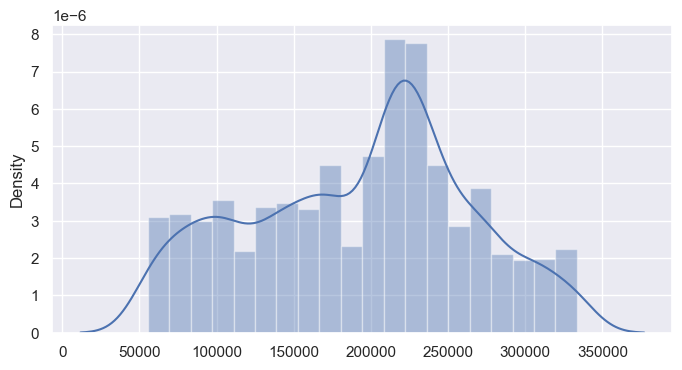

In [60]:
sns.distplot(transformed_value)

In [61]:
shapiro(transformed_value)

ShapiroResult(statistic=0.9734108448028564, pvalue=5.69975417413848e-23)

In [62]:
transformed_value.std()

71709.56658486863

In [63]:
df_new["Life expectancy"].std()

9.2987252274834

We can transform the data to normally dstributed with this code:<br>
`df_copy["Life_expectancy_normal"]=transformed_value`

`Note:` I am Not doing this transformation because data is almost normally distributed

## Correlation

In [64]:
corr =df_copy.corr()
corr

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.167377,-0.070646,-0.037415,-0.069147,0.031400,0.020904,-0.082493,0.108484,-0.042937,0.091286,0.073515,0.131382,-0.139741,0.091480,0.014027,-0.048081,-0.049934,0.236594,0.200081
Life expectancy,0.167377,1.000000,-0.697739,-0.199713,0.389018,0.379416,0.173798,-0.159978,0.561289,-0.225987,0.461737,0.218380,0.475260,-0.553065,0.429627,-0.029935,-0.495911,-0.491475,0.691562,0.740414
Adult Mortality,-0.070646,-0.697739,1.000000,0.084675,-0.196594,-0.250388,-0.123546,0.032841,-0.388321,0.100429,-0.280988,-0.122413,-0.280789,0.468508,-0.289770,-0.003927,0.325283,0.332375,-0.445121,-0.458562
infant deaths,-0.037415,-0.199713,0.084675,1.000000,-0.112918,-0.085612,-0.167086,0.501128,-0.226796,0.996629,-0.171068,-0.131938,-0.175496,0.025231,-0.102829,0.551667,0.347137,0.349783,-0.141571,-0.203462
Alcohol,-0.069147,0.389018,-0.196594,-0.112918,1.000000,0.344410,0.090920,-0.049752,0.313022,-0.109790,0.212083,0.306768,0.212725,-0.046235,0.313060,-0.026836,-0.427892,-0.417230,0.418372,0.517314
percentage expenditure,0.031400,0.379416,-0.250388,-0.085612,0.344410,1.000000,0.039372,-0.056596,0.227408,-0.087852,0.146356,0.190573,0.142669,-0.097857,0.901819,-0.016888,-0.260664,-0.263008,0.374730,0.394424
Hepatitis B,0.020904,0.173798,-0.123546,-0.167086,0.090920,0.039372,1.000000,-0.072788,0.112403,-0.170284,0.367195,0.063863,0.451725,-0.085962,0.076851,-0.124023,-0.084432,-0.088244,0.118102,0.153509
Measles,-0.082493,-0.159978,0.032841,0.501128,-0.049752,-0.056596,-0.072788,1.000000,-0.176069,0.507809,-0.136671,-0.107092,-0.142718,0.030899,-0.069253,0.237188,0.192356,0.188367,-0.111089,-0.127115
BMI,0.108484,0.561289,-0.388321,-0.226796,0.313022,0.227408,0.112403,-0.176069,1.000000,-0.237048,0.281309,0.226048,0.280274,-0.243383,0.273932,-0.069667,-0.548565,-0.556179,0.471947,0.526465
under-five deaths,-0.042937,-0.225987,0.100429,0.996629,-0.109790,-0.087852,-0.170284,0.507809,-0.237048,1.000000,-0.188980,-0.133395,-0.195886,0.038062,-0.106093,0.539260,0.353447,0.354942,-0.159264,-0.219132


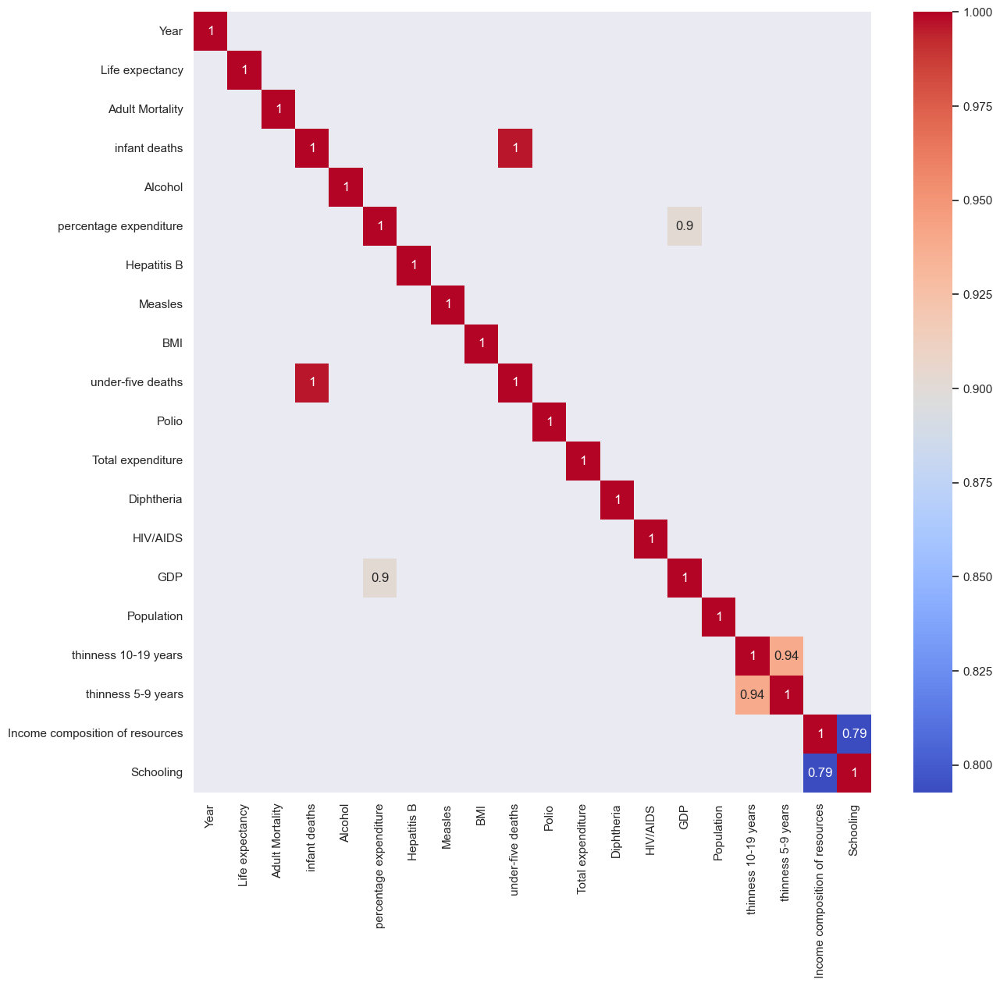

In [65]:
plt.figure(figsize=(14,13))
cr1=corr[(corr >=.75) | abs(corr<=-.75)] 
sns.heatmap(cr1, annot=True, cmap="coolwarm")
plt.show()


## Inference:
#### Correlation map of the features. 1 means positively correlated, -1 means negatively correlated.<br>
`-> Infant deaths and Under-Five deaths are positively correlated .` <br>
`-> GDP and percentage expenditure are highly correlated too. Also thinness 10-19 years and thinness 5-9 are highly correlated.`<br>
#### I would like to drop one of the features, if their correlation is bigger than 0.75 or less than -0.75. <br>
So I will drop:<br> 
`-> Under five (because infant death seams more important),` <br>
`-> percentage expenditure (I think GDP has more important informations) and` <br> 
`-> thinness 5-9 years (because we have infant deaths column by which we can get a similar idea)` <br>
`-> as well as Income composition of resources which seems less important then Schooling`.

In [66]:
df_copy =df_copy.drop(labels=['Income composition of resources', 'thinness 5-9 years', 
                'under-five deaths', 'percentage expenditure'], axis=1)
df_copy.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,65.0,1154,19.1,7.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,62.0,492,18.6,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,64.0,430,18.1,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,67.0,2787,17.6,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.8,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,68.0,3013,17.2,68.0,7.87,68.0,0.1,63.537231,2978599.0,17.8,9.5


In [67]:
df_copy.columns.unique()

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'Hepatitis B', 'Measles', 'BMI', 'Polio',
       'Total expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population',
       'thinness 10-19 years', 'Schooling'],
      dtype='object')

In [68]:
df_copy.columns.nunique()

18

## Auto-Correlation check

### Durbin watson test

In [69]:
import pandas as pd
# from statsmodels.formula.api import ols
from statsmodels.stats.stattools import durbin_watson
import statsmodels.api as sm

In [70]:
x=df_copy.drop(columns=["Life expectancy","Country","Status"])
y=df_copy["Life expectancy"]


In [71]:
X = sm.add_constant(x) #For adding constant term
reg=sm.OLS(y,X).fit()
print(reg.summary())

                            OLS Regression Results                            
Dep. Variable:        Life expectancy   R-squared:                       0.814
Model:                            OLS   Adj. R-squared:                  0.814
Method:                 Least Squares   F-statistic:                     855.2
Date:                Wed, 21 Dec 2022   Prob (F-statistic):               0.00
Time:                        00:29:12   Log-Likelihood:                -8245.1
No. Observations:                2938   AIC:                         1.652e+04
Df Residuals:                    2922   BIC:                         1.662e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   75.2509 

In [72]:
durbin_watson(reg.resid)

0.6922668212156239

`Note:` Dublin_watson test score indicates:<br>
-->The closer the test statistics is to 0, the more evidence of positive serial correlation.<br>
-->The closer the test statistics is to 4, the more evidence of negative serial correlation.<br>

Which means this data is somewhat possitively correlated. So, i will treat it by shuffling the data in train test split. 

## Feature Engineering 

### Replacing:
1)Status(Devloped) to  `0`<br>
2) Status(Devloping) to  `1`

In [73]:
df_copy.replace({"Status":{'Developing':1,'Developed':0}},inplace=True)

### Lable Encoding Values of countries

In [74]:
from sklearn.preprocessing import LabelEncoder

In [75]:
lb=LabelEncoder()
lb.fit_transform(df_copy["Country"])

array([  0,   0,   0, ..., 192, 192, 192])

In [76]:
df_copy["Country"]=lb.fit_transform(df_copy["Country"])

In [77]:
df_copy.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,Schooling
0,0,2015,1,65.0,263.0,62,0.01,65.0,1154,19.1,7.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,10.1
1,0,2014,1,59.9,271.0,64,0.01,62.0,492,18.6,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,10.0
2,0,2013,1,59.9,268.0,66,0.01,64.0,430,18.1,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,9.9
3,0,2012,1,59.5,272.0,69,0.01,67.0,2787,17.6,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.8,9.8
4,0,2011,1,59.2,275.0,71,0.01,68.0,3013,17.2,68.0,7.87,68.0,0.1,63.537231,2978599.0,17.8,9.5


In [78]:
df_copy["Status"].value_counts()

1    2426
0     512
Name: Status, dtype: int64

In [79]:
# Independent Features
features = df_copy.drop(columns=["Life expectancy"],axis=1)
features.head()

,Country,Year,Status,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 10-19 years,Schooling
0,0,2015,1,263.0,62,0.01,65.0,1154,19.1,7.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,10.1
1,0,2014,1,271.0,64,0.01,62.0,492,18.6,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,10.0
2,0,2013,1,268.0,66,0.01,64.0,430,18.1,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,9.9
3,0,2012,1,272.0,69,0.01,67.0,2787,17.6,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.8,9.8
4,0,2011,1,275.0,71,0.01,68.0,3013,17.2,68.0,7.87,68.0,0.1,63.537231,2978599.0,17.8,9.5


Target Varaible -> `"Life expectancy"`

In [80]:
#Target variable
target = df_copy["Life expectancy"]
target.head()

0    65.0
1    59.9
2    59.9
3    59.5
4    59.2
Name: Life expectancy, dtype: float64

## Feature selection

In [81]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(random_state = 42)
regressor.fit(features,target)  


RandomForestRegressor(random_state=42)

In [82]:
#Checking feature importance using random forest
imp_feat=pd.DataFrame({"var":features.columns,"imp":regressor.feature_importances_}).sort_values(by=["imp"],ascending=False)
imp_feat

,var,imp
12,HIV/AIDS,0.602215
3,Adult Mortality,0.204056
16,Schooling,0.077052
8,BMI,0.023581
15,thinness 10-19 years,0.019331
4,infant deaths,0.017658
2,Status,0.011324
5,Alcohol,0.008102
1,Year,0.007560
0,Country,0.005710


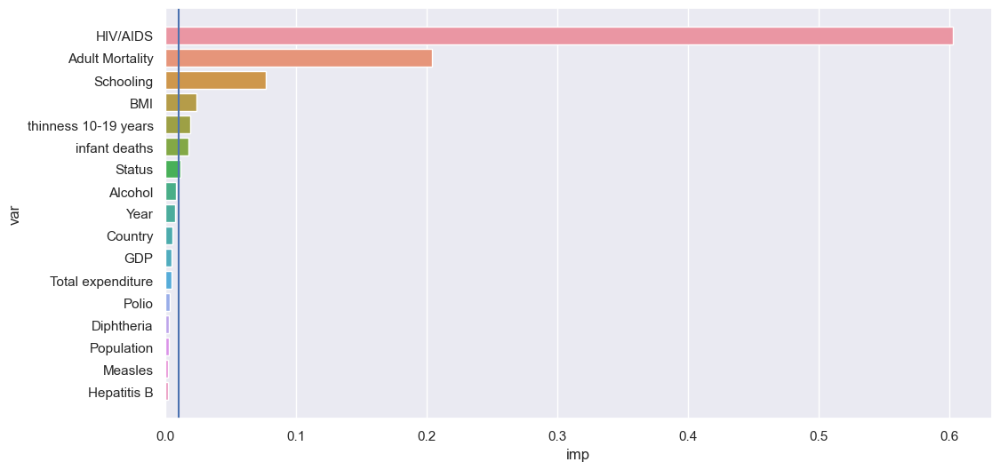

In [83]:
#Ploting feature importance
plt.figure(figsize = (12,6))
sns.barplot(x = "imp",y="var",data = imp_feat)
plt.axvline(x = 0.01)
plt.plot()
plt.show()

In [84]:
selected_var=imp_feat[imp_feat["imp"]>=0.01]["var"].to_list()   
selected_var

['HIV/AIDS',
 'Adult Mortality',
 'Schooling',
 'BMI',
 'thinness 10-19 years',
 'infant deaths',
 'Status']

In [85]:
selected_var=df_copy[['HIV/AIDS',
 'Adult Mortality',
 'Schooling',
 'BMI',
 'thinness 10-19 years',
 'infant deaths',
 'Status',
 "Life expectancy"]]

In [86]:
selected_var.head()

,HIV/AIDS,Adult Mortality,Schooling,BMI,thinness 10-19 years,infant deaths,Status,Life expectancy
0,0.1,263.0,10.1,19.1,17.2,62,1,65.0
1,0.1,271.0,10.0,18.6,17.5,64,1,59.9
2,0.1,268.0,9.9,18.1,17.7,66,1,59.9
3,0.1,272.0,9.8,17.6,17.8,69,1,59.5
4,0.1,275.0,9.5,17.2,17.8,71,1,59.2


## Model development

In [87]:
x1=selected_var.drop(columns=["Life expectancy"],axis=1)
y1=selected_var["Life expectancy"]

## Train test split

In [88]:
# Did data shuffle in order to deal with autocorrelation
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size = 0.25, random_state = 42,shuffle=True)

In [89]:
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(2203, 7) (2203,)
(735, 7) (735,)


### Standard Scaler

In [90]:
from sklearn.preprocessing import StandardScaler


In [91]:
scaler = StandardScaler().fit(x_train,y_train)
x_train_scaled = scaler.transform(x_train)


In [92]:
pd.DataFrame(x_train_scaled, columns=pd.DataFrame(x_train).columns).head()

,HIV/AIDS,Adult Mortality,Schooling,BMI,thinness 10-19 years,infant deaths,Status
0,-0.262277,0.936292,0.926940,0.951654,-0.542667,-0.213272,0.465247
1,-0.320205,-0.307392,0.400961,0.677170,-0.834346,-0.195210,0.465247
2,-0.320205,-0.145543,0.072224,-0.335926,0.064998,-0.204241,0.465247
3,0.317006,1.634799,-1.604335,-1.184331,0.794196,-0.041686,0.465247
4,-0.320205,-0.213690,0.663950,0.292892,-0.348214,-0.258426,0.465247


In [93]:
y_train

2737    67.7
789     75.5
707     71.0
424     54.8
69      75.6
        ... 
1638    84.0
1095    56.7
1130    61.8
1294    79.9
860     59.4
Name: Life expectancy, Length: 2203, dtype: float64

In [94]:
x_test_scaled = scaler.transform(x_test)
pd.DataFrame(x_test_scaled, columns=pd.DataFrame(x_test).columns).head()

,HIV/AIDS,Adult Mortality,Schooling,BMI,thinness 10-19 years,infant deaths,Status
0,-0.320205,-0.341466,-0.223640,0.497508,0.405290,-0.186179,0.465247
1,-0.320205,-0.426649,0.598203,0.976607,-0.712813,-0.258426,-2.149395
2,-0.320205,-0.324429,0.499582,0.931692,-0.639893,-0.258426,0.465247
3,-0.320205,-1.329598,0.795445,1.216157,0.332370,-0.258426,0.465247
4,3.155490,2.256641,-1.209851,-1.204293,1.085875,0.436947,0.465247


# Linear Regression

## Assumptions of Linear Regression:
    1. The Two Variables Should be in a Linear Relationship (yes its true)
    2. All the Variables Should be Multivariate Normal (checked this with shapiro test, data is almost normally distributed)
    3. There Should be No Multicollinearity in the Data (we treated it by dropping highly correated columns)
    4. There Should be No Autocorrelation in the Data (checked it with OLS and did dublin watson test)
    5. There Should be Homoscedasticity Among the Data (low or no variance in error residual)

In [95]:
lin_reg=LinearRegression()
lin_reg.fit(x_train_scaled,y_train)

LinearRegression()

In [96]:
y_test

2546    73.7
650     75.9
1740    74.2
177     76.8
1377    51.9
        ... 
2284    72.7
1554    65.5
862     58.8
1413    69.9
1762    69.0
Name: Life expectancy, Length: 735, dtype: float64

In [97]:
y_pred_lin=lin_reg.predict(x_test_scaled)

In [98]:
print(y_pred_lin)

[70.26262681 76.44656531 73.76557417 77.66956845 48.3199146  52.82737473
 68.83059079 70.71665776 75.29330005 52.97315403 52.04013043 62.99206349
 66.39240595 70.0221894  69.55030046 62.46518666 60.06308745 80.29728177
 68.81362155 81.70584088 80.56798142 83.22779053 69.53805079 68.23799386
 69.22849769 68.67222253 59.53890129 63.62439702 80.18250111 70.5021842
 66.39615624 74.70870573 72.34676564 67.47071498 76.53265612 56.88419687
 67.54104282 73.60131578 64.47340241 76.41393616 58.32811297 64.98467753
 72.69113412 80.7392513  76.62759078 58.52525062 79.11821643 70.07159179
 65.72946518 65.61384857 64.11976857 70.15622916 78.57174041 72.0745857
 73.78592583 59.14823414 76.04402259 69.25325849 69.66905182 67.64595066
 77.12762359 58.25035185 73.2540301  69.39941851 54.65037659 51.77040711
 50.83798421 79.89948123 55.28794506 81.55010266 78.04109796 75.40405228
 73.41066738 60.43294118 58.82715681 69.17819663 62.76376128 77.64017702
 58.77616476 65.75031108 64.32011097 59.47738239 65.2

### Estimating the model 

In [99]:
#Making function for performance evaluation in regression models   
def model_metric_reg(y_test,y_pred):
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    r2s = r2_score(y_test,y_pred)
    return mae,mse,rmse,r2s


In [100]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_lin)

In [101]:
train_score_lin = lin_reg.score(x_train_scaled,y_train)
test_score_lin = lin_reg.score(x_test_scaled,y_test)
print("Train Score for",lin_reg,"is",train_score_lin)
print("Test Score for",lin_reg,"is",test_score_lin)

Train Score for LinearRegression() is 0.7930376293680109
Test Score for LinearRegression() is 0.7854609289165151


In [102]:
result1 = pd.DataFrame({'Model':'lin_reg',"Train Score":train_score_lin,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[0])

## Random Forest Regressor

In [103]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 100, random_state = 42)
regressor.fit(x_train_scaled,y_train)  


RandomForestRegressor(random_state=42)

In [104]:
y_pred_rf = regressor.predict(x_test_scaled) 


In [105]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_rf)

In [106]:
train_score_rf = regressor.score(x_train_scaled,y_train)
test_score_rf = regressor.score(x_test_scaled,y_test)
print("Train Score for",regressor,"is",train_score_rf)
print("Test Score for",regressor,"is",test_score_rf)

Train Score for RandomForestRegressor(random_state=42) is 0.9949382675958055
Test Score for RandomForestRegressor(random_state=42) is 0.9679076112412791


In [107]:
result2 = pd.DataFrame({'Model':'Random_Forest_Regressor',"Train Score":train_score_rf,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[1])

## K Nearest Neighbours

In [108]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=5)

knn.fit(x_train_scaled, y_train) 

 


KNeighborsRegressor()

In [109]:
y_pred_knn = knn.predict(x_test_scaled)

In [110]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_knn)

In [111]:
train_score_knn = knn.score(x_train_scaled,y_train)
test_score_knn = knn.score(x_test_scaled,y_test)
print("Train Score for",knn,"is",train_score_knn)
print("Test Score for",knn,"is",test_score_knn)

Train Score for KNeighborsRegressor() is 0.9613400397942711
Test Score for KNeighborsRegressor() is 0.9554994560739762


In [112]:
result3 = pd.DataFrame({'Model':'KNN',"Train Score":train_score_knn,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[2])

## SVM

In [113]:
from sklearn.svm import SVR

svr = SVR(kernel="linear")
svr.fit(x_train_scaled, y_train) 
 


SVR(kernel='linear')

In [114]:
y_pred_svr= svr.predict(x_test_scaled)

In [115]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_svr)

In [116]:
train_score_svm = svr.score(x_train_scaled,y_train)
test_score_svm = svr.score(x_test_scaled,y_test)
print("Train Score for",svr,"is",train_score_svm)
print("Test Score for",svr,"is",test_score_svm)

Train Score for SVR(kernel='linear') is 0.7737274019309169
Test Score for SVR(kernel='linear') is 0.7564532528923661


In [117]:
result4 = pd.DataFrame({'Model':'SVM',"Train Score":train_score_svm,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[3])

## Decision Tree Regressor

In [118]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor(random_state=42)

In [119]:
# Hyper parameters range intialization for tuning 

parameters={"max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,4,6,8,10],
           "max_features":["auto","log2","sqrt"],
           "max_leaf_nodes":[None,10,20,40,60,70,90] }

In [120]:
# calculating different regression metrics

from sklearn.model_selection import GridSearchCV
tuning_model=GridSearchCV(dtr,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
tuning_model.fit(x_train_scaled,y_train)

Fitting 3 folds for each of 630 candidates, totalling 1890 fits
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1;, score=-35.442 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=1;, score=-37.553 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4;, score=-35.442 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=4;, score=-37.553 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=None, min_samples_leaf=6;, score=-35

[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4;, score=-35.442 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=4;, score=-37.553 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6;, score=-35.442 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=6;, score=-37.553 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8;, score=-34.899 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=auto, max_leaf_nodes=70, min_samples_leaf=8;, score=-35.442 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=auto, max_leaf_no

[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=4;, score=-60.774 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6;, score=-57.768 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=6;, score=-60.774 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8;, score=-57.768 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=8;, score=-60.774 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=log2, max_leaf_nodes=40, min_samples_leaf=10;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=log2, max_leaf_n

[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8;, score=-57.768 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=8;, score=-60.774 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10;, score=-57.768 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=10;, score=-60.774 total time=   0.0s
[CV 1/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1;, score=-65.468 total time=   0.0s
[CV 2/3] END max_depth=1, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=1;, score=-57.768 total time=   0.0s
[CV 3/3] END max_depth=1, max_features=sqrt, max_leaf

[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=8;, score=-18.028 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10;, score=-15.356 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=10;, score=-18.028 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1;, score=-15.356 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=1;, score=-18.028 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=4;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, 

[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6;, score=-15.356 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=6;, score=-18.028 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8;, score=-15.356 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=8;, score=-18.028 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10;, score=-15.756 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=auto, max_leaf_nodes=90, min_samples_leaf=10;, score=-15.356 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=auto, max_leaf_

[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1;, score=-31.982 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-26.991 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-31.982 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-26.991 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-31.982 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=log2, max_leaf_no

[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-26.991 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-31.982 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-26.991 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-31.982 total time=   0.0s
[CV 1/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-21.751 total time=   0.0s
[CV 2/3] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-26.991 total time=   0.0s
[CV 3/3] END max_depth=3, max_features=sqrt, max_leaf_no

[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=10;, score=-14.939 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-10.583 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-10.583 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-10.583 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=auto, max_leaf_nod

[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1;, score=-14.966 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1;, score=-18.363 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=1;, score=-20.473 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4;, score=-15.451 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4;, score=-17.937 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=4;, score=-18.092 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6;, score=-14.975 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=6;, score=-19.472 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=l

[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=1;, score=-13.717 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-17.316 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-16.581 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=4;, score=-14.356 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-15.403 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-16.184 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=6;, score=-13.423 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=8;, score=-15.682 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=log2, max_leaf_no

[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=1;, score=-13.717 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-17.316 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-16.581 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-14.356 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-15.403 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-16.184 total time=   0.0s
[CV 3/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-13.423 total time=   0.0s
[CV 1/3] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-15.682 total time=   0.0s
[CV 2/3] END max_depth=5, max_features=sqrt, max_leaf_no

[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-11.018 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=1;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=auto, max_leaf_nodes

[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10;, score=-12.568 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-22.048 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-23.968 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-22.048 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-23.968 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf

[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4;, score=-11.795 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4;, score=-16.273 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-11.150 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-12.020 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-12.102 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.343 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-12.264 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.326 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=log2, max_leaf_no

[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-12.633 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-16.507 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-11.289 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-11.948 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-12.102 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-11.275 total time=   0.0s
[CV 2/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-12.494 total time=   0.0s
[CV 3/3] END max_depth=7, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-11.326 total time=   0.0s
[CV 1/3] END max_depth=7, max_features=sqrt, max_leaf_no

[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=4;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=auto, max_leaf_nodes

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-22.048 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-23.968 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-22.048 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-23.968 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6;, score=-21.886 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=10, min_samples_leaf=6;, score=-26.964 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_no

[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-10.066 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-9.775 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.822 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.546 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-9.618 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10;, score=-11.447 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10;, score=-12.781 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=log2, max_leaf_nodes=90, min_samples_leaf=10;, score=-13.889 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_n

[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-10.237 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10;, score=-11.744 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10;, score=-13.628 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=10;, score=-14.075 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1;, score=-8.101 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1;, score=-11.217 total time=   0.0s
[CV 3/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=1;, score=-11.433 total time=   0.0s
[CV 1/3] END max_depth=9, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=4;, score=-9.981 total time=   0.0s
[CV 2/3] END max_depth=9, max_features=sqrt, max_leaf_n

[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=6;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=8;, score=-11.399 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10;, score=-10.851 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10;, score=-9.264 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=auto, max_leaf_nodes=20, min_samples_leaf=10;, score=-11.414 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=auto, ma

[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=8;, score=-12.529 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10;, score=-9.847 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10;, score=-11.204 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=None, min_samples_leaf=10;, score=-10.655 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-22.048 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=1;, score=-23.968 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=10, min_samples_leaf=4;, score=-20.554 total time=   0.0s
[CV 2/3] END max_depth=11, max_feature

[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4;, score=-10.058 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4;, score=-9.631 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=4;, score=-12.404 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-9.529 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-9.976 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=6;, score=-9.765 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.419 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=log2, max_leaf_nodes=90, min_samples_leaf=8;, score=-11.858 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=log2, max_le

[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-9.614 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-11.405 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=4;, score=-14.124 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-11.021 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-11.341 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=6;, score=-10.908 total time=   0.0s
[CV 1/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-12.325 total time=   0.0s
[CV 2/3] END max_depth=11, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=8;, score=-12.573 total time=   0.0s
[CV 3/3] END max_depth=11, max_features=sqrt, max

GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=42),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_features': ['auto', 'log2', 'sqrt'],
                         'max_leaf_nodes': [None, 10, 20, 40, 60, 70, 90],
                         'min_samples_leaf': [1, 4, 6, 8, 10]},
             scoring='neg_mean_squared_error', verbose=3)

In [121]:
tuning_model.best_params_


{'max_depth': 11,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_leaf': 6}

`Note:` With help of hyperparameter tuning we got to know best parameters so, these will be applied in model.

In [122]:
# Applying best parameters
dtr = DecisionTreeRegressor(max_depth=11,max_features='auto',max_leaf_nodes= None,min_samples_leaf= 6,random_state=42)
dtr.fit(x_train_scaled, y_train) 


DecisionTreeRegressor(max_depth=11, max_features='auto', min_samples_leaf=6,
                      random_state=42)

In [123]:
y_pred_dtr = dtr.predict(x_test_scaled)


In [124]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_dtr)

In [125]:
train_score_dt = dtr.score(x_train_scaled,y_train)
test_score_dt = dtr.score(x_test_scaled,y_test)
print("Train Score for",'DecionTree',"is",train_score_dt)
print("Test Score for",'DecionTree',"is",test_score_dt)

Train Score for DecionTree is 0.9701166340185161
Test Score for DecionTree is 0.9486236568585944


In [126]:
result5 = pd.DataFrame({'Model':'Decision_Tree',"Train Score":train_score_dt,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[4])

# AdaBoost

In [127]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
ada = AdaBoostRegressor()
grid=GridSearchCV(estimator=ada,param_grid={'n_estimators':range(1,50),'learning_rate':[.001,0.01,.1],'random_state':[42]})
grid.fit(x_train_scaled, y_train) 
print("The best estimator returned by GridSearch CV is:", grid.best_estimator_)


The best estimator returned by GridSearch CV is: AdaBoostRegressor(learning_rate=0.1, n_estimators=49, random_state=42)


`Note:` With grid search cv i got to know best n estimator is `49`  and leaning rate=`0.1`.so will conider the same and generate best outputs.

In [128]:
# Create adaboost regressor with 39 stump trees
adaboost = AdaBoostRegressor(n_estimators=49,learning_rate=0.1,random_state=42)
adaboost.fit(x_train_scaled, y_train)


AdaBoostRegressor(learning_rate=0.1, n_estimators=49, random_state=42)

In [129]:
y_pred_ada = adaboost.predict(x_test_scaled)


In [130]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_ada)

In [131]:
train_score_ada = adaboost.score(x_train_scaled,y_train)
test_score_ada = adaboost.score(x_test_scaled,y_test)
print("Train Score for",adaboost,"is",train_score_ada)
print("Test Score for",adaboost,"is",test_score_ada)

Train Score for AdaBoostRegressor(learning_rate=0.1, n_estimators=49, random_state=42) is 0.8823940899307248
Test Score for AdaBoostRegressor(learning_rate=0.1, n_estimators=49, random_state=42) is 0.882236398857985


In [133]:
result6 = pd.DataFrame({'Model':'AdaBoost',"Train Score":train_score_ada,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[5])

# XgBoost

In [134]:
from xgboost import XGBRegressor 

xgboost = XGBRegressor(objective ='reg:linear',max_depth=5,n_estimators = 100,learning_rate = 0.1,random_state=42)
xgboost.fit(x_train_scaled, y_train) 


[00:32:26] WARNING: C:/Users/administrator/workspace/xgboost-win64_release_1.6.0/src/objective/regression_obj.cu:203: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, objective='reg:linear', predictor='auto',
             random_state=42, reg_alpha=0, ...)

In [135]:
y_pred_xg = xgboost.predict(x_test_scaled)


In [136]:
mae,mse,rmse,r2s=model_metric_reg(y_test, y_pred_xg)

In [137]:
train_score_xg = xgboost.score(x_train_scaled,y_train)
test_score_xg = xgboost.score(x_test_scaled,y_test)
print("Train Score for",'XGBoost',"is",train_score_xg)
print("Test Score for",'XGBoost',"is",test_score_xg)

Train Score for XGBoost is 0.9808198606028984
Test Score for XGBoost is 0.9646528433037668


In [138]:
result7 = pd.DataFrame({'Model':'XGBoost',"Train Score":train_score_xg,
                        'R2_Score':r2s,'MSE':mse,'RMSE':rmse},index=[6])

In [139]:
result = pd.concat([result1,result2,result3,result4,result5,result6,result7])
print(result)

                     Model  Train Score  R2_Score        MSE      RMSE
0                  lin_reg     0.793038  0.785461  18.755865  4.330804
1  Random_Forest_Regressor     0.994938  0.967908   2.805645  1.675006
2                      KNN     0.961340  0.955499   3.890416  1.972414
3                      SVM     0.773727  0.756453  21.291832  4.614307
4            Decision_Tree     0.970117  0.948624   4.491526  2.119322
5                 AdaBoost     0.882394  0.882236  10.295366  3.208639
6                  XGBoost     0.980820  0.964653   3.090190  1.757894


In [142]:
# Can also export the score to a excel file
result.to_csv("Model_Scores.csv")

# Web Devlopment

In [144]:
import pickle
pickle.dump(lin_reg,open('log_reg.pkl','wb'))
pickle.dump(regressor,open('ran_forest.pkl','wb'))
pickle.dump(knn,open('knn.pkl','wb'))
pickle.dump(svr,open('svr.pkl','wb'))
pickle.dump(dtr,open('dt.pkl','wb'))
pickle.dump(adaboost,open('ada_boost.pkl','wb'))
pickle.dump(xgboost,open('xg_boost.pkl','wb'))
